### Coisas a fazer:
- Fazer undersampling básico para as classificações binárias

- Undersampling + Oversampling (zoom, virar, deslocar...) Para o modelo multi classes (os 93) podemos fazer até x10

- Dividir a imagem em Bins para analisar onde de acumula o hashing, usar como método de semelhança (isto não o percebo muito bem)

- Falamos nos blobs, mas eu interpreto que não é necessário (só se tivermos tempo)

- Usar padding mínimo se fazemos CNN com imagens rectangulares

- Modelo com autoencoder pode ser menos interessante

- Começar com as imagens menos resolutivas e redes mais simples, depois vamos incrementando (**Atual: 150x75**)

- Validação-test 90:10 ou 80:20 são ambas boas proporções

- Modelo preto/branco mais rápido

- Fazer atenção ao Pacience (5epocas), quando a loss desce e a accuracy fica estável é sintoma de overfitting, podemos usar esta situação para parametrizar a Pacience

- Número de parâmetros ao final da rede deve servir proporcional ao tamanho da imagem, não deve ter excesso de parâmetros

- A accuracy só para a validação final, entre epochs usamos a loss 

- O batch normalization standariza os delta intra-camada

- Pooling Max

- Remover imagens Erradas

- Lidar com as imagens duplicadas

- (Gerar imagens) (Isto vai para anexo código no relatório)

In [ ]:
!pip install -q tfds-nightly tensorflow matplotlib

In [ ]:
!pip install tensorflow --upgrade

In [ ]:
!pip install imagehash

In [ ]:
pip install scikit-image

In [ ]:
pip install xgboost

In [6]:
pip install --upgrade jinja2

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.1/133.1 kB 5.3 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from collections import Counter
from itertools import product
import tensorflow_datasets as tfds
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras import preprocessing
import pathlib
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split,GridSearchCV
import pandas as pd
from collections import Counter,defaultdict
import seaborn as sns
import os
import time
import imagehash
from skimage.feature import blob_dog, blob_log, blob_doh
from skimage.color import rgb2gray
import matplotlib.patches as patches
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score,silhouette_samples,confusion_matrix,recall_score,precision_score
import matplotlib.cm as cm
from sklearn.model_selection import KFold

# 1. **Load Data**

In [3]:
bee_ds, bee_info = tfds.load('bee_dataset/bee_dataset_150',split='train',shuffle_files=True,with_info=True)

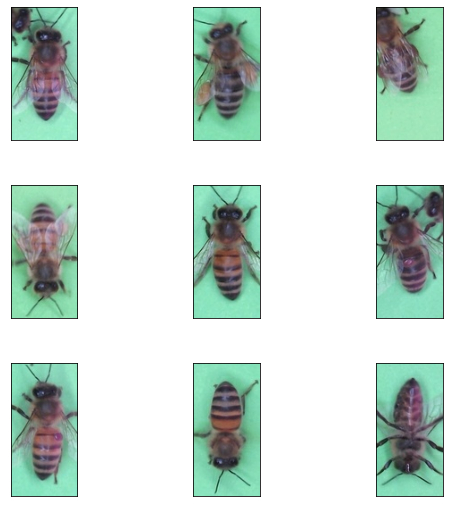

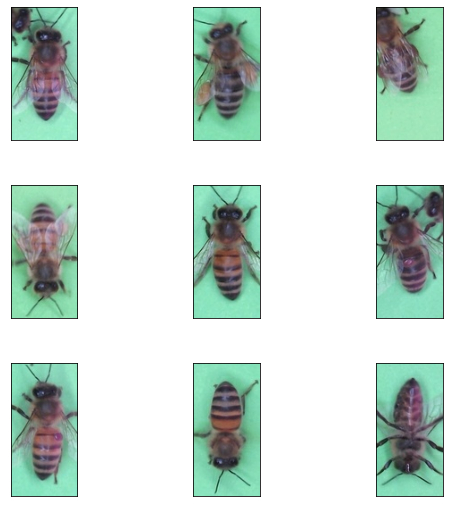

In [4]:
tfds.show_examples(bee_ds,bee_info)

# 2. **Exploratory Data Analysis**

Before starting the EDA task, the bee dataset will be converted to a dataframe in order to ease the EDA phase. Alongi

In [5]:
bee_df = tfds.as_dataframe(bee_ds,bee_info)

In [6]:
bee_df.columns

Index(['input', 'output/cooling_output', 'output/pollen_output',
       'output/varroa_output', 'output/wasps_output'],
      dtype='object')

Our dataset is composed by the input or X that corresponds to the images and we have 4 target binary variables.

In [7]:
print("Size of a image:",bee_df['input'][0].shape)

Size of a image: (150, 75, 3)


The images have a size of 300x150 and as expected are on rgb.

In [8]:
#Checking for Missing values
bee_df.isna().value_counts()

input  output/cooling_output  output/pollen_output  output/varroa_output  output/wasps_output
False  False                  False                 False                 False                  7490
dtype: int64

In [9]:
def convert_to_grayscale(img):
  #Convert to tensor
  tensor_img = tf.convert_to_tensor(img)
  #Convert from rgb to grayscale
  img_bw = tf.image.rgb_to_grayscale(tensor_img)

  return img_bw

In [10]:
def hash_image(img):
  img_bw = convert_to_grayscale(img)
  #Hash Image
  #hash_img = str(imagehash.phash(tf.keras.utils.array_to_img(img_bw.numpy())))
  hash_img = str(imagehash.phash(tf.keras.preprocessing.image.array_to_img(img_bw.numpy())))
  return hash_img

Check Duplicates

In [11]:
#Checking for duplicated images
counts_imgs = dict()
arr_dups = list()
#Loop over images
for i, img in enumerate(bee_df['input'].values):
  #hash image
  hash_img = hash_image(img)
  #Add to dataframe
  bee_df.loc[i,'hash'] = hash_img


In [12]:
"""
get_image: Plots image  
Arguments:
  df = DataFrame where images are stored
  img_index = position of image
  axe = pass axe to plot if subplots are needed
"""
def plot_image(df,img_index,axe=None):
    if axe is not None:
      #axe.imshow(tf.keras.utils.array_to_img(df.loc[img_index,'input']))
      axe.imshow(tf.keras.preprocessing.image.array_to_img(df.loc[img_index,'input']))
    else:
      #plt.imshow(tf.keras.utils.array_to_img(df.loc[img_index,'input']))
      plt.imshow(tf.keras.preprocessing.image.array_to_img(df.loc[img_index,'input']))
      plt.show()

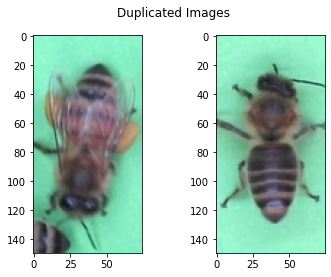

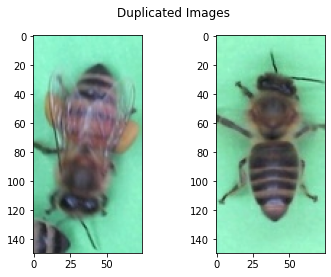

In [13]:
#Loop over array of indexes of duplicated images
dups = bee_df.index[bee_df.duplicated(subset=['hash'],keep=False)]

for i in range(0,len(dups)-1,2):
  #Set axis to plot images
  fig, (ax1, ax2) = plt.subplots(1,2)
  #Set title
  fig.suptitle("Duplicated Images")
  #Plot images
  plot_image(bee_df,dups[i],ax1)
  plot_image(bee_df,dups[i+1],ax2)
  

In [14]:
"""
plot_class_counts: Plots a barplot with the respective number of instances existed on the dataset for a given target variable
Arguments:
  df = DataFrame to perform the counting (pd.DataFrame)
  target = target variable/class to count the number of examples (string)
  title = title of the plot (string)
  labels = labels to be plotted on the x axis (list of strings)
"""
def plot_class_counts(df,target,title,labels):
    fig,ax = plt.subplots(figsize=(6,6))
    #vals = df.value_counts(subset=[target])
    blist = plt.bar(labels,df.value_counts(subset=[target]),color=['#30A5BF','#F2BE22'])
    #blist[1].set_color('y')
    plt.title(title)
    total = len(df.values)
    for p in ax.patches:
      #Get percentages for classes
          percentage = '{:.1f}%'.format(100 * (p.get_height()/total))
          x = p.get_x() + p.get_width()/2 - 0.05
          y = p.get_y() + p.get_height() + 50
          ax.annotate(percentage, (x, y))
      #Get absolute values for classes
          x = p.get_x() + p.get_width()/2 - 0.05
          y = p.get_y() + p.get_height()/2
          ax.annotate(p.get_height(),(x,y))


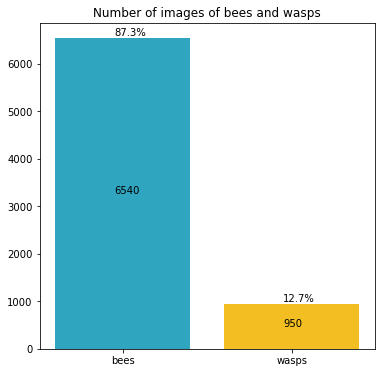

In [15]:
plot_class_counts(bee_df,'output/wasps_output','Number of images of bees and wasps',['bees','wasps'])

Analysing the graphic, clearly there is an imbalanced of classes, where 87.3% of dataset is composed by bees' images and only 12.7% of the images correspond to wasps.

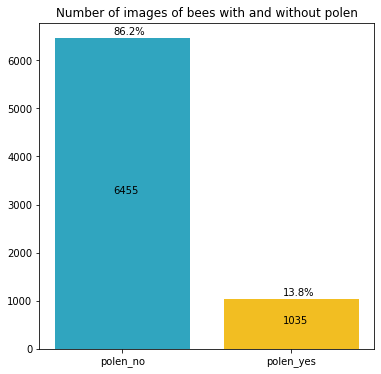

In [31]:
plot_class_counts(bee_df,'output/pollen_output','Number of images of bees with and without polen',['polen_no','polen_yes'])

Similarly, to the previous situations, there is another imbalance of classes regarding the images that polen is present or not. Existing only 1035 images where this is true.  

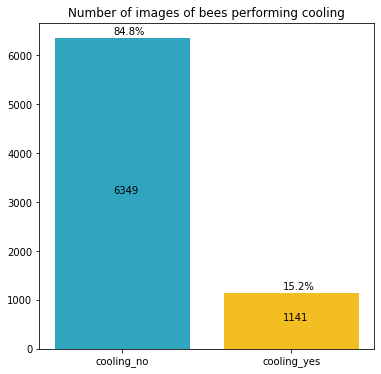

In [32]:
plot_class_counts(bee_df,'output/cooling_output','Number of images of bees performing cooling',['cooling_no','cooling_yes'])

For the cooling target variable, it exists another imbalance of classes, where 15.2% of images corresponds to bees performing the cooling process.

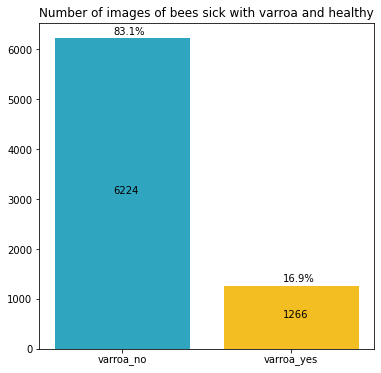

In [33]:
plot_class_counts(bee_df,'output/varroa_output','Number of images of bees sick with varroa and healthy',['varroa_no','varroa_yes'])

Again, for the varroa, sickness, target variable, it is verified another imbalance of classes, where 16.2% of images corresponds to bees sick with the varroa.

In [34]:
bee_info_df = bee_df[['output/cooling_output','output/pollen_output','output/varroa_output','output/wasps_output']]
bee_info_df['sum'] = bee_df[['output/cooling_output','output/pollen_output','output/varroa_output','output/wasps_output']].sum(axis = 1)
print(len(bee_info_df[bee_info_df['sum'] >1]), "Observations with more than a caracteristic","\n")

# na tabela pivot table vemos um resumo das possíveis combinaçoes entre variáveis dependentes.
print(pd.crosstab(bee_info_df['output/cooling_output'],bee_info_df['output/pollen_output']),"\n")
print(pd.crosstab(bee_info_df['output/cooling_output'],bee_info_df['output/varroa_output']),"\n")
print(pd.crosstab(bee_info_df['output/pollen_output'],bee_info_df['output/varroa_output']),"\n")
print(pd.crosstab(bee_info_df['output/pollen_output'],bee_info_df['output/wasps_output']),"\n")
print(pd.crosstab(bee_info_df['output/wasps_output'],bee_info_df['output/varroa_output']),"\n")
print(pd.crosstab(bee_info_df['output/cooling_output'],bee_info_df['output/wasps_output']),"\n")


159 Observations with more than a caracteristic 

output/pollen_output    0.0  1.0
output/cooling_output           
0.0                    5407  942
1.0                    1048   93 

output/varroa_output    0.0   1.0
output/cooling_output            
0.0                    5148  1201
1.0                    1076    65 

output/varroa_output   0.0   1.0
output/pollen_output            
0.0                   5190  1265
1.0                   1034     1 

output/wasps_output    0.0  1.0
output/pollen_output           
0.0                   5506  949
1.0                   1034    1 

output/varroa_output   0.0   1.0
output/wasps_output             
0.0                   5274  1266
1.0                    950     0 

output/wasps_output     0.0  1.0
output/cooling_output           
0.0                    5400  949
1.0                    1140    1 



From analysing the possibles situations where we might have wasps with polen, or cooling. It was found that this happend for one case of each situation. Furthermore, it was verified that there are 93 cases where cooling and polen target variables were true.

Therefore, we consider this outliers each demand our attention to handle them carefully.

In [35]:
"""
get_plot_outliers: Selects and plots the images of the outliers identified
Arguments:
  df = DataFrame (pandas.DataFrame)
  target1 = target variable/class (string)
  target2 = target variable/class (string)
"""
def get_plot_outliers(df,target1,target2):
  #Get Index or array of indexes where condition is true
  idx = bee_df.index[(bee_df[target1]==1.0) & (bee_df[target2]==1.0)]
  #Loop over the indexes
  for i in idx:
    #Plot image
    plt.imshow(tf.keras.utils.array_to_img(bee_df.loc[i,'input']))
    plt.show()

IMAGEM ERRADA

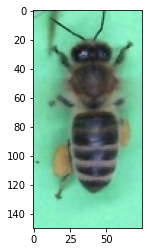

In [36]:
#Get example where wasp is true and polen is true
get_plot_outliers(bee_df,'output/wasps_output','output/pollen_output')

IMAGEM ERRADA

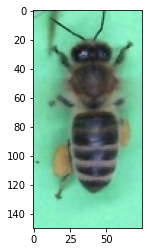

In [37]:
#Get example where wasp is true and cooling is true
get_plot_outliers(bee_df,'output/wasps_output','output/cooling_output')

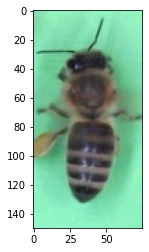

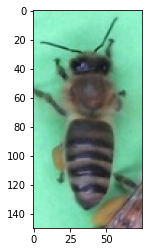

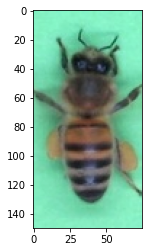

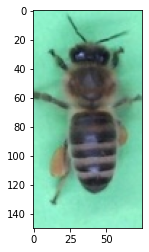

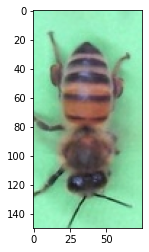

...

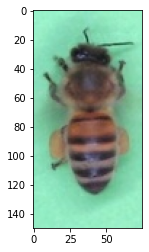

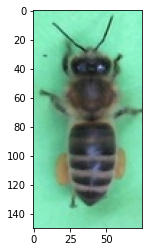

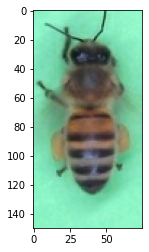

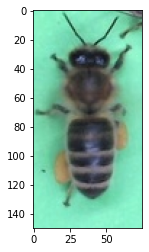

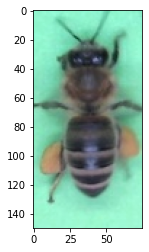

In [38]:
#Get example where pollen is true and cooling is true
get_plot_outliers(bee_df,'output/pollen_output','output/cooling_output')

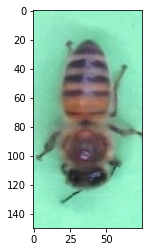

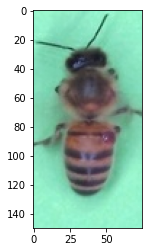

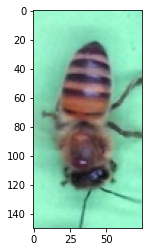

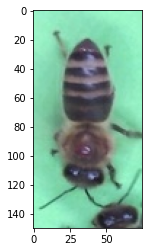

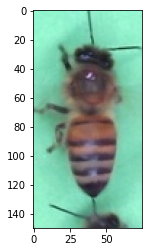

...

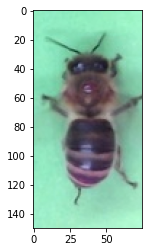

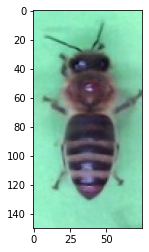

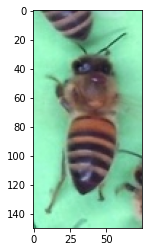

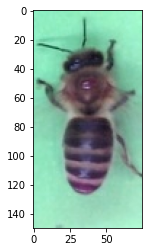

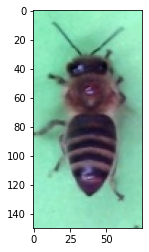

In [39]:
#Get example where varroa is true and cooling is true
get_plot_outliers(bee_df,'output/varroa_output','output/cooling_output')

# 3.1 **Pre-Processing Data**




### Fix The imbalance dataset

Normalization of images

In [11]:
bee_df['input'] = bee_df['input'].apply(lambda x: (x / 255).astype(np.float32))

Remove Duplicates

In [12]:
bee_df = bee_df.drop(dups)

Remover Imagem errada

In [13]:
idx = bee_df.index[(bee_df['output/wasps_output']==1.0) & (bee_df['output/pollen_output']==1.0) & (bee_df['output/cooling_output']==1.0)]
bee_df = bee_df.drop(idx)

Blobs

In [14]:
def convert_rgb_gray(img):
  return rgb2gray(img)

In [15]:
def binarize_image(img,threshold):
  img_binarize = img > threshold
  return img_binarize

In [16]:
def detect_blobs(data):
  blobs = list()
  for i in data.index:
    #Detect blobs
    img_bw = convert_rgb_gray(data[i])
    img_binarize = binarize_image(img_bw,0.6)
    #blob_doh(img_binarize,max_sigma=40,threshold=0.01
    blobs.append({"blobs":blob_doh(img_binarize,min_sigma=20,max_sigma=40,threshold=0.01),
                  "img_index":i})
  return blobs

In [17]:
def plot_blobs(data,arr_blobs):
  for i in range(len(data)):
    img_bw = convert_rgb_gray(data[i])
    img_binarize = binarize_image(img_bw,0.6)
    fig, ax = plt.subplots(1,1,figsize=(10,5))
    plt.imshow(img_binarize,cmap='gray')
    for i, blobs in enumerate(arr_blobs):
      for blob in blobs:
        y,x, area = blob
        ax.add_patch(plt.Circle((x, y), area, color='r', 
                                fill=False))
      plt.show()

X,y são as coordenas centrais do blob
Através da área conseguimos encontrar o raio
Através da soma do raio às coordenas conseguimos selecionar os pixels dentro do blob

ter em atenção situações exceção quando a subtração de x-r ou y-r é um número negativo

In [18]:
def get_blobs_area(data,blobs_df):
  img_blobs_area = list()
  arr_blobs,index = blobs_df['blobs'].values,blobs_df['img_index'].values
  for i,blobs in enumerate(arr_blobs):
    for blob in blobs:
      #x,y,area = blob
      x = blob[0].astype(np.int64)
      y = blob[1].astype(np.int64)
      area = blob[2]
      r = np.ceil(np.sqrt(area/np.pi)).astype(np.int64)
      #print("x:{},y:{},r:{}".format(x,y,r))
      r = r + np.ceil(2*np.pi*r).astype(np.int64)
      if x > r:
        idx_rows = np.s_[x-r:x+r]
      else:
        idx_rows = np.s_[x:x+r]
      
      if y > r:
        idx_cols = np.s_[y-r:y+r]
      else:
        idx_cols = np.s_[y:y+r]
      
      img_blobs_area.append({"blob_area":data[index[i]][idx_rows,idx_cols],"img_index":index[i]})
  return img_blobs_area

In [19]:
def plot_image_blob_area(data,blobs_area):
  for i in range(len(data)):
    for area in blobs_area:
      plt.imshow(area)
      plt.show()

Number of images: 3258


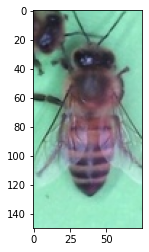

In [20]:
bee_only_df = bee_df.loc[(bee_df['output/wasps_output'] == 0.0) &
                        (bee_df['output/pollen_output'] == 0.0 )&
                        (bee_df['output/cooling_output'] == 0.0) &
                        (bee_df['output/varroa_output'] == 0.0)]
#bee_only_df = bee_only_df.drop(columns=['output/cooling_output','output/pollen_output','output/varroa_output'])
plt.imshow(bee_only_df['input'].values[0])
print("Number of images:", len(bee_only_df.values))

In [21]:
blobs_df = pd.DataFrame(detect_blobs(bee_only_df['input']))

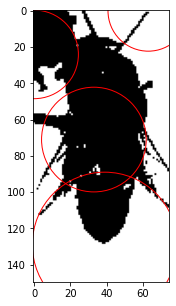

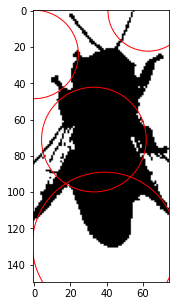

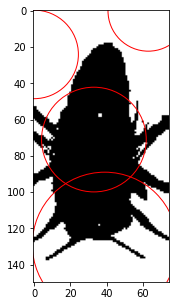

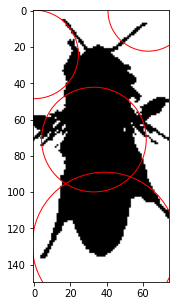

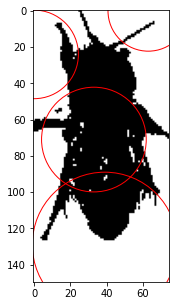

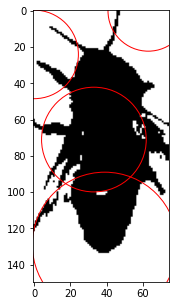

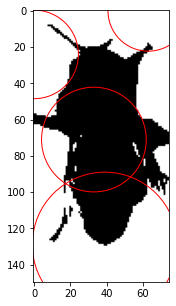

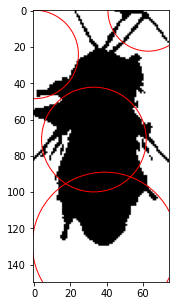

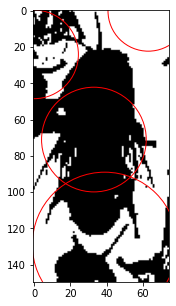

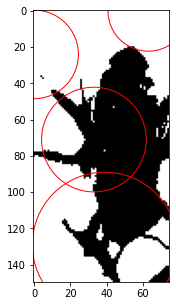

In [52]:
plot_blobs(bee_only_df['input'].head(10).values,blobs_df['blobs'])

In [22]:
blobs_area_df = pd.DataFrame(get_blobs_area(bee_only_df['input'],blobs_df))
blobs_area_df

,blob_area,img_index
0,"[[[0.5411765, 0.8509804, 0.7254902], [0.541176...",0
1,"[[[0.5529412, 0.78039217, 0.6862745], [0.56862...",0
2,"[[[0.2627451, 0.24313726, 0.22745098], [0.2980...",0
3,"[[[0.43529412, 0.654902, 0.54901963], [0.18039...",0
4,"[[[0.5176471, 0.7607843, 0.6627451], [0.537254...",4
...,...,...
13058,"[[[0.46666667, 0.81960785, 0.6784314], [0.4470...",7482
13059,"[[[0.49411765, 0.7647059, 0.5803922], [0.48235...",7484
13060,"[[[0.41568628, 0.34509805, 0.30588236], [0.356...",7484
13061,"[[[0.53333336, 0.85490197, 0.6745098], [0.5372...",7484


In [54]:
run = False
if run:
    plot_image_blob_area(bee_only_df['input'].head(10),blobs_area_df['blob_area'])

Clustering blobs

In [23]:
#resize images
x_resized = list()
for i in range(len(blobs_area_df['blob_area'])):
  #img = tf.convert_to_tensor(np.asarray(blobs_area_df['blob_area'][i]).astype(np.float32) / 255)
  img = convert_to_grayscale(blobs_area_df['blob_area'][i])
  img = tf.image.resize(img,[40,40],method='bilinear').numpy().flatten()
  x_resized.append(img)

In [24]:
x_resized = np.asarray(x_resized)

In [25]:
kmeans = KMeans(n_clusters=2,random_state=0)
kmeans.fit(x_resized)

KMeans(n_clusters=2, random_state=0)

In [26]:
def get_cluster_idx(labels,cluster_label):
  return np.where(labels == cluster_label)

In [27]:
def plot_examples_on_cluster(idx_cluster,cluster_label,n):
  print("Cluster {}".format(cluster_label))
  for i,val in enumerate(idx_cluster[:n]):
    plt.imshow(blobs_area_df['blob_area'][val])
    plt.show()

In [28]:
idx_cluster0 = get_cluster_idx(kmeans.labels_,0)[0]
idx_cluster1 = get_cluster_idx(kmeans.labels_,1)[0]

In [61]:
#for i in range(len(kmeans.labels_[:1000])-5):
  #print(kmeans.labels_[i:i+5])

for i in range(len(kmeans.labels_[:1000])):
  print("Cluster:{},img_index:{}".format(kmeans.labels_[i],blobs_area_df.loc[i,'img_index']))

Cluster:1,img_index:0
Cluster:1,img_index:0
Cluster:0,img_index:0
Cluster:0,img_index:0
Cluster:1,img_index:4
Cluster:1,img_index:4
Cluster:1,img_index:4
Cluster:1,img_index:4
Cluster:0,img_index:4
Cluster:0,img_index:8
Cluster:0,img_index:8
Cluster:0,img_index:8
Cluster:0,img_index:10
Cluster:0,img_index:10
Cluster:1,img_index:11
Cluster:0,img_index:11
Cluster:0,img_index:11
Cluster:1,img_index:15
Cluster:1,img_index:15
Cluster:1,img_index:15
Cluster:1,img_index:15
Cluster:0,img_index:15
Cluster:0,img_index:17
Cluster:0,img_index:17
Cluster:1,img_index:17
Cluster:1,img_index:18
Cluster:1,img_index:18
Cluster:1,img_index:18
Cluster:0,img_index:18
Cluster:1,img_index:22
Cluster:0,img_index:22
Cluster:0,img_index:22
Cluster:1,img_index:23
Cluster:1,img_index:23
Cluster:1,img_index:23
Cluster:1,img_index:23
Cluster:0,img_index:23
Cluster:1,img_index:25
Cluster:1,img_index:25
Cluster:0,img_index:25
Cluster:1,img_index:25
Cluster:1,img_index:25
Cluster:1,img_index:27
Cluster:1,img_index:27


### Cluster 0

Cluster 0


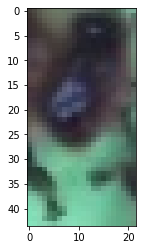

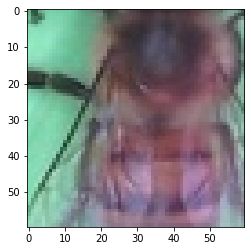

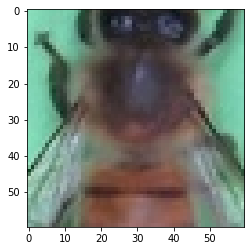

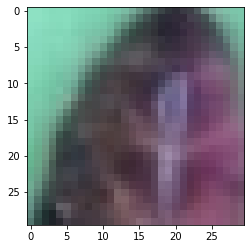

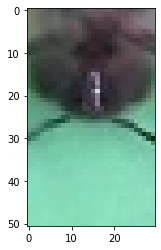

...

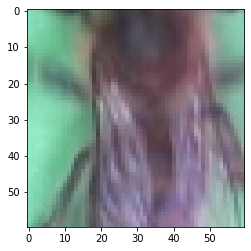

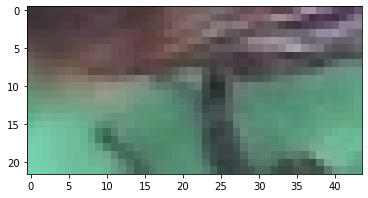

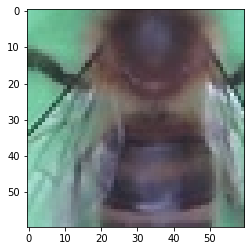

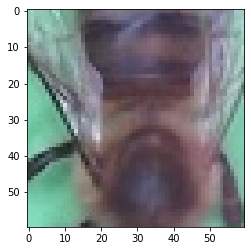

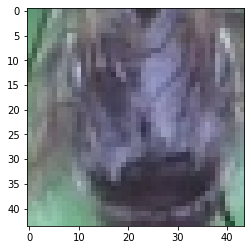

In [62]:
plot_examples_on_cluster(idx_cluster0,0,100)

### Cluster 1

Cluster 1


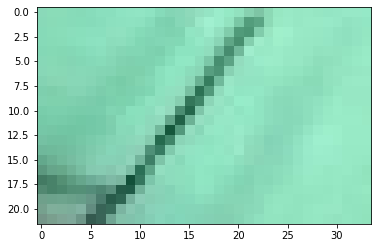

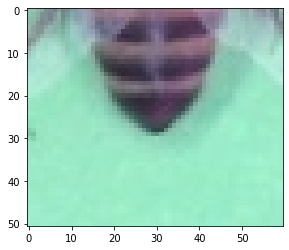

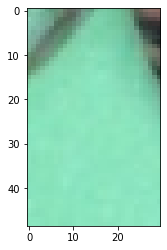

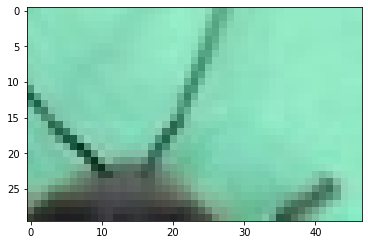

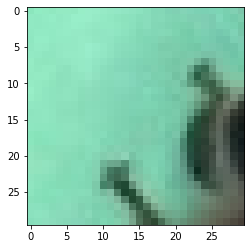

...

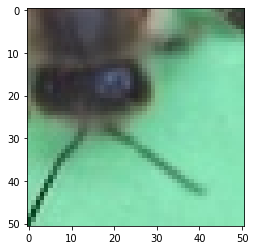

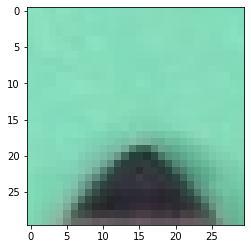

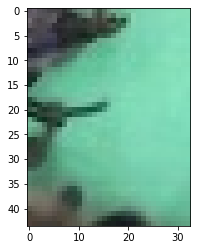

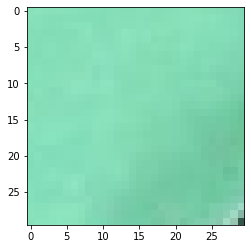

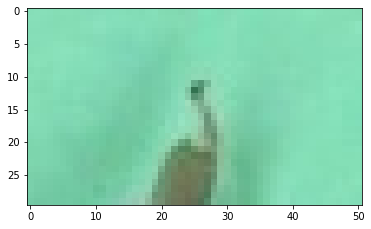

In [63]:
plot_examples_on_cluster(idx_cluster1,1,100)

Eliminar Imagens do Cluster 0

In [29]:
idx_imgs_cluster1 = np.unique(blobs_area_df.loc[idx_cluster0,'img_index'].values)
#Delete images from cluster 1
bee_df = bee_df.drop(idx_imgs_cluster1)

In [30]:
bee_df.value_counts(subset=['output/wasps_output'])

output/wasps_output
0.0                    3431
1.0                     949
dtype: int64

In [31]:
print(len(bee_df.loc[(bee_df['output/wasps_output']==0) & (bee_df['output/pollen_output'] == 0.0 )&
                        (bee_df['output/cooling_output'] == 0.0) &
                        (bee_df['output/varroa_output'] == 0.0)].values))

153


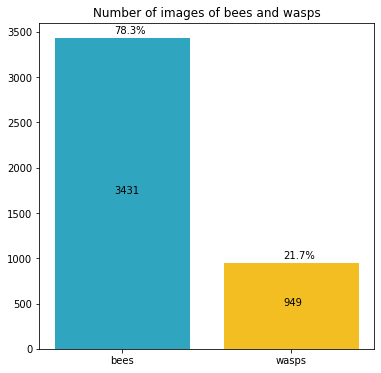

In [32]:
plot_class_counts(bee_df,'output/wasps_output','Number of images of bees and wasps',['bees','wasps'])

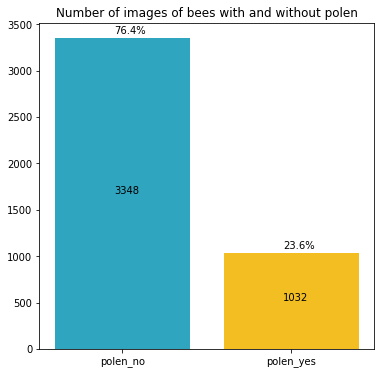

In [33]:
plot_class_counts(bee_df,'output/pollen_output','Number of images of bees with and without polen',['polen_no','polen_yes'])

In [31]:
augment_bee_df = bee_df.copy().drop(columns=['hash']).reset_index(drop=True)

### Data Augmentation

In [32]:
def data_augmentation(ds,labels,n):
  if n > len(ds):
    raise Exception("n argument is bigger than sample size")
  ds = tf.data.Dataset.from_tensor_slices((tf.convert_to_tensor(ds[:n]),tf.convert_to_tensor(labels[:n])))
  data_augmentation = tf.keras.Sequential([
                              layers.RandomFlip("horizontal_and_vertical"),
                              #layers.RandomRotation(0.1),
                              layers.RandomContrast(0.3),
                              layers.RandomTranslation(0.1,0.1)
                              #layers.Input(shape=(150,75,3)),
                              #layers.experimental.preprocessing.RandomFlip('horizontal_and_vertical'),
                              #layers.experimental.preprocessing.RandomContrast(0.3),
                              #layers.experimental.preprocessing.RandomTranslation(0.1,0.1)
                              
  ])

  ds = ds.map(lambda x,y:(data_augmentation(x,training=True),y))
  return ds

In [33]:
def assign_ds_to_df(df,ds):
    temp = list()
    for i, (x,y) in enumerate(ds):
        temp.append({"input":x.numpy(),
                'output/cooling_output':y.numpy()[0],
                'output/pollen_output':y.numpy()[1],
                'output/varroa_output':y.numpy()[2],
                'output/wasps_output':y.numpy()[3]}) #,'bee_job':y.numpy()[4]

    temp_df = pd.DataFrame(temp)
    concat_df = pd.concat([df,temp_df])
    return concat_df

In [34]:
def augment_data(df,cond,n):
    ds = np.asarray(df.loc[cond,'input'].tolist()).astype(np.float32)
    labels = np.asarray(df.loc[cond,df.columns[1:]]).astype(np.float32)
    data_aug = data_augmentation(ds,labels,n)
    return assign_ds_to_df(df,data_aug)

In [35]:
def augment_by_factor(df,cond,n,factor):
    augmented_df = df.copy()
    for i in range(0,factor):
        augmented_df = augment_data(augmented_df,cond,n)
    return augmented_df

### Wasp Augmentation

In [36]:
bee_wasp_df = augment_by_factor(augment_bee_df,(augment_bee_df['output/wasps_output'] == 1.0),600,3).reset_index(drop=True)

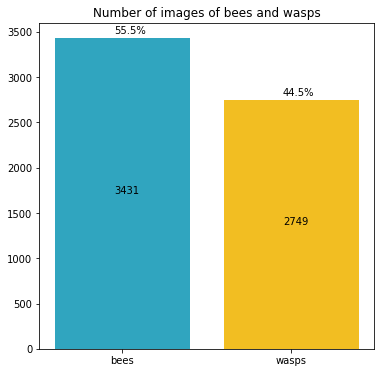

In [37]:
plot_class_counts(bee_wasp_df,(bee_wasp_df['output/wasps_output'] == 1.0),'Number of images of bees and wasps',['bees','wasps'])

Varroa Augmentation

In [80]:
#Remove wasps
varroa_df = augment_bee_df.drop(augment_bee_df.loc[augment_bee_df['output/wasps_output']== 1.0].index).reset_index(drop=True)
#varroa_df_IVS = bee_df_IVS.drop(bee_df_IVS.loc[bee_df_IVS['output/wasps_output']== 1.0].index).reset_index(drop=True)
#Augment Data on train
varroa_df = augment_by_factor(varroa_df,(varroa_df['output/varroa_output'] == 1.0),800,1).reset_index(drop=True)

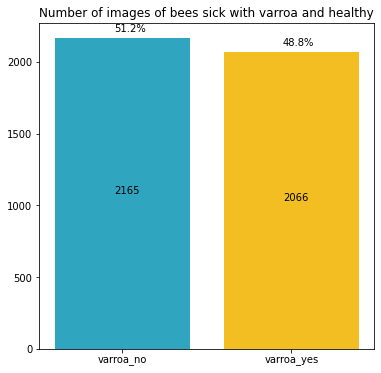

In [81]:
plot_class_counts(varroa_df,(varroa_df['output/varroa_output'] == 1.0),'Number of images of bees sick with varroa and healthy',['varroa_no','varroa_yes'])

Bee job train Augmentation

In [40]:
#Remove wasps
multi_df = augment_bee_df.drop(augment_bee_df.loc[augment_bee_df['output/wasps_output']== 1.0].index).reset_index(drop=True)
#multi_df_IVS = bee_df_IVS.drop(bee_df_IVS.loc[bee_df_IVS['output/wasps_output']== 1.0].index).reset_index(drop=True)
#Augment Data on train
multi_df = augment_by_factor(multi_df,(multi_df['output/cooling_output'] == 1.0),700,2).reset_index(drop=True)
multi_df = augment_by_factor(multi_df,(multi_df['output/pollen_output'] == 1.0),600,2).reset_index(drop=True)
multi_df = augment_by_factor(multi_df,(multi_df['output/pollen_output'] == 1.0 )&\
                                   (multi_df['output/cooling_output'] == 1.0),90,2).reset_index(drop=True)

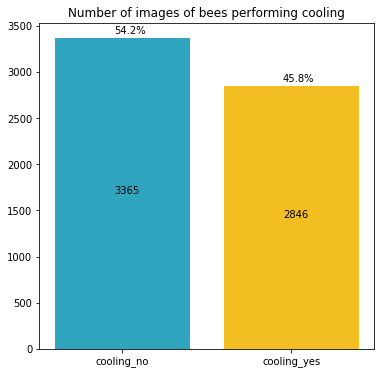

In [42]:
plot_class_counts(multi_df,(multi_df['output/cooling_output'] == 1.0),'Number of images of bees performing cooling',['cooling_no','cooling_yes'])

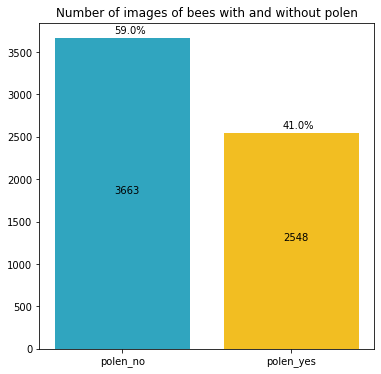

In [43]:
plot_class_counts(multi_df,(multi_df['output/pollen_output'] == 1.0),'Number of images of bees with and without polen',['polen_no','polen_yes'])

## Classification

#### Split into train and independet validation set

In [44]:
def split_dataset(df):
    X_train, X_IVS, y_train, y_test_IVS = train_test_split(df['input'].values,df[df.columns[1:]].values,test_size=0.33, random_state=42)
    return X_train, X_IVS, y_train, y_test_IVS

In [45]:
def create_df(X,y):
    df = pd.DataFrame({'input':X})
    df['output/cooling_output'] = y[:,0]
    df['output/pollen_output'] = y[:,1]
    df['output/varroa_output'] = y[:,2]
    df['output/wasps_output'] =  y[:,3]
    return df

In [46]:
def reshape_dataset(train,test,cond_train,cond_test,target,isSeries=True):
    X_train = np.asarray(list(train.loc[cond_train,'input'])).astype(np.float32)
    X_IVS = np.asarray(list(test.loc[cond_test,'input'])).astype(np.float32)

    if isSeries:
        y_train = np.asarray(list(train.loc[cond_train,target])).astype(np.float32)
        y_IVS = np.asarray(list(test.loc[cond_test,target])).astype(np.float32)
    else:
        y_train = np.asarray(list(train.loc[cond_train,target].values)).astype(np.float32)
        y_IVS = np.asarray(list(test.loc[cond_test,target].values)).astype(np.float32)

    #return train_ds,test_ds

    return X_train,X_IVS,y_train,y_IVS


### Dataset For Binary Classification Bee VS Wasp

In [ ]:
X_train_bee,X_IVS_bee,y_train_bee,y_IVS_bee = split_dataset(bee_wasp_df)
bee_wasp_df_train = create_df(X_train_bee,y_train_bee)
bee_df_IVS = create_df(X_IVS_bee,y_IVS_bee)

In [ ]:
cond_train = (bee_wasp_df_train['output/wasps_output'] == 0.0) | (bee_wasp_df_train['output/wasps_output'] == 1.0)
cond_test = (bee_df_IVS['output/wasps_output'] == 0.0) | (bee_df_IVS['output/wasps_output'] == 1.0)
#Creation Dataset
#X_train_bee_wasp,y_train_bee_wasp,X_test_bee_wasp,y_test_bee_wasp = create_ds(bee_df_train,bee_df_test,cond_train,cond_test,'output/wasps_output')

#X_train_bee,y_train_bee = (np.asarray(list(bee_df_train.loc[:,'input'])).astype(np.float32),np.asarray(list(bee_df_train.loc[:,'output/wasps_output'])).astype(np.float32))

X_train_bee,X_IVS_bee,y_train_bee,y_IVS_bee = reshape_dataset(bee_wasp_df_train,bee_df_IVS,cond_train,cond_test,'output/wasps_output')

### Dataset For Binary Classification Varroa VS No Varroa

In [82]:
X_train_varroa,X_IVS_varroa,y_train_varroa,y_IVS_varroa = split_dataset(varroa_df)
varroa_df_train = create_df(X_train_varroa,y_train_varroa)
varroa_df_IVS = create_df(X_IVS_varroa,y_IVS_varroa)

In [83]:
cond_train = (varroa_df_train['output/varroa_output'] == 0.0) | (varroa_df_train['output/varroa_output'] == 1.0)
cond_test = (varroa_df_IVS['output/wasps_output'] == 0.0) | (varroa_df_IVS['output/wasps_output'] == 1.0)
#Creation Dataset
#X_train_varroa,y_train_varroa,X_test_varroa,y_test_varroa= create_ds(bee_df_train,bee_df_test,cond,'output/varroa_output')
X_train_varroa,X_IVS_varroa,y_train_varroa,y_IVS_varroa = reshape_dataset(varroa_df_train,varroa_df_IVS,cond_train,cond_test,'output/varroa_output')

### Dataset For Multi Classe Classification  Bee Job

In [47]:
X_train_multi,X_IVS_multi,y_train_multi,y_IVS_multi = split_dataset(multi_df)
multi_df_train = create_df(X_train_multi,y_train_multi)
multi_df_IVS = create_df(X_IVS_multi,y_IVS_multi)

In [50]:
cond_train = (multi_df_train['output/cooling_output'] == 0.0) | (multi_df_train['output/cooling_output'] == 1.0)| \
(multi_df_train['output/pollen_output'] == 0.0) | (multi_df_train['output/pollen_output'] == 1.0)

cond_test = (multi_df_IVS['output/cooling_output'] == 0.0) | (multi_df_IVS['output/cooling_output'] == 1.0)| \
(multi_df_IVS['output/pollen_output'] == 0.0) | (multi_df_IVS['output/pollen_output'] == 1.0)

#Creation Dataset
#train_ds_bee_job,val_ds_bee_job = create_ds(bee_df_train,bee_df_test,cond,bee_df_train.columns[1:3],False)
X_train_multi,X_IVS_multi,y_train_multi,y_IVS_multi= reshape_dataset(multi_df_train,multi_df_IVS,cond_train,cond_test,multi_df_train.columns[1:3],False)

In [51]:
def create_multi_target_var(df):
    for i, val in enumerate(df.values[:,1:3]):
        if val[0] == 0.0 and val[1] == 0.0:
            df.loc[i,'bee_job'] = 0.0
        elif val[0] == 1.0 and val[1] == 0.0:
            df.loc[i,'bee_job'] = 1.0
        elif val[0] == 0.0 and val[1] == 1.0:
            df.loc[i,'bee_job'] = 2.0
        elif val[0] == 1.0 and val[1] == 1.0:
            df.loc[i,'bee_job'] = 3.0
            
    return df['bee_job']

In [52]:
multi_df_train['bee_job'] = create_multi_target_var(multi_df_train)
multi_df_IVS['bee_job'] = create_multi_target_var(multi_df_IVS)

In [53]:
#Create target for XGBoost
y_train_bee_job_XGB = np.asarray(list(multi_df_train.loc[(multi_df_train['output/cooling_output'] == 0.0) | \
                                                       (multi_df_train['output/cooling_output'] == 1.0) | \
                                                       (multi_df_train['output/pollen_output'] == 0.0) | \
                                                       (multi_df_train['output/pollen_output'] == 1.0),'bee_job'])).astype(np.float32)

y_IVS_bee_job_XGB = np.asarray(list(multi_df_IVS.loc[(multi_df_IVS['output/cooling_output'] == 0.0) | \
                                                    (multi_df_IVS['output/cooling_output'] == 1.0) | \
                                                    (multi_df_IVS['output/pollen_output'] == 0.0) | \
                                                    (multi_df_IVS['output/pollen_output'] == 1.0),'bee_job'])).astype(np.float32)

TRAIN MODELS
CNN - Exemplo da aula


Se não tiver Dense como é que faz o backpropogation?



HyperParams:

- Batch Size
- Kernel number/size
- Numero de camadas / Neuronios por Camada
- 

In [54]:
def create_model(instructions,dims):
  model = tf.keras.Sequential()
  model.add(layers.Input(shape=dims))
  for instruct in instructions:
    for key in instruct:
      if key == 'Conv2D':
        model.add(layers.Conv2D(instruct[key][0],instruct[key][1],padding='same',activation='relu'))
      elif key == 'BatchNormalization':
        model.add(layers.BatchNormalization(momentum =instruct[key][0],epsilon=instruct[key][1]))
      elif key == 'MaxPooling2D':
        model.add(layers.MaxPooling2D(instruct[key][0]))
      elif key == 'Dropout':
        model.add(layers.Dropout(instruct[key][0]))
      elif key == 'Dense':
        model.add(layers.Dense(instruct[key][0],activation=instruct[key][1]))
      elif key == 'Flatten':
        model.add(layers.Flatten(name=instruct[key][0]))
      else:
        raise Exception("Provide one the following layer types: [Conv2D, BatchNormalization, MaxPooling, Dropout, Dense, Flatten]")
  return model

Cross-validation

In [55]:
def grid_search(params):
  combinations = list(product(*(params[key] for key in params)))
  models = list()
  for comb in combinations:
    model_def = [
                    {'Conv2D':[comb[0][0],comb[1]]},
                    {'BatchNormalization':[comb[2],comb[3]]},
                    {'Conv2D':[comb[0][1],comb[1]]},
                    {'BatchNormalization':[comb[2],comb[3]]},
                    {'MaxPooling2D':[comb[4]]},
                    {'Conv2D':[comb[0][2],comb[1]]},
                    {'Conv2D':[comb[0][2],comb[1]]},
                    {'Conv2D':[comb[0][2],comb[1]]},
                    {'MaxPooling2D':[comb[4]]},
                    {'Conv2D':[comb[0][2],comb[1]]},
                    {'Conv2D':[comb[0][2],comb[1]]},
                    {'Conv2D':[comb[0][2],comb[1]]},
                    {'MaxPooling2D':[comb[4]]},
                    {'Conv2D':[comb[0][3],comb[1]]},
                    {'Conv2D':[comb[0][3],comb[1]]},
                    {'Conv2D':[comb[0][3],comb[1]]},
                    {'MaxPooling2D':[comb[4]]},
                    {'Dropout':[comb[5]]},
                    {'Flatten':[comb[8]]},
                    {'Dense':[comb[6],comb[7]]}
                 ]
    models.append(model_def)
  return models
  #return model with combination of params

In [56]:
tf.config.experimental_run_functions_eagerly(True)

Instructions for updating:
Use `tf.config.run_functions_eagerly` instead of the experimental version.


Instructions for updating:
Use `tf.config.run_functions_eagerly` instead of the experimental version.


In [57]:
def cv(X,y,params,cv_splits,batch_sz=64,epochs=10,loss=None,dims=None,isNN=True):
  #***CNN****
  if isNN:
    kf = KFold(n_splits=cv_splits,shuffle=True,random_state=0)
    history_models = list()
    models_def = grid_search(params)
    for i, model_def in enumerate(models_def):
      #Clear model from memory
      tf.keras.backend.clear_session()
      #Create Model
      model = create_model(model_def,dims)
      #Name Model
      model._name = 'cnn_{}'.format(i)
      #Compile Model
      early_stopping = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=5)
      model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                loss=loss,
                metrics=['accuracy'])
      #Save initial weights to reset after each fold
      model.save_weights('initial_weights.h5')
      print(model.summary())
      i=0
      for train_idx,test_idx in kf.split(X):
        print("Fold number:",i)
        #Reset Weights
        model.load_weights('initial_weights.h5')
        #get train-test set
        X_train, y_train = X[train_idx], y[train_idx]
        X_test, y_test = X[test_idx], y[test_idx]
        #batch_values = np.arange(50,150,25)
        #for batch in batch_values:
        #Fit model
        history = model.fit(
          x=X_train,
          y=y_train,
          validation_data=(X_test,y_test),
          epochs=epochs,
          batch_size = batch_sz,
          callbacks=early_stopping
        )
        i+=1
        history_models.append({'model_name':model.name,'model_def':model_def,'history':history})
    return history_models
  #***XGBOOST******
  else:
    xgb = XGBClassifier(eval_metric='error')
    gcv = GridSearchCV(xgb,params,cv=cv_splits)
    gcv.fit(X,y)
    return gcv.cv_results_

In [58]:
def get_scores(history,n_splits):
    hist_df = pd.DataFrame(history)
    scores = list()
    for i in range(n_splits,len(history)+n_splits,n_splits):
        vals_accuracy_scores = list()
        vals_loss_scores = list()
        for j in range(i-n_splits,i):
            #Append validation accuracy from last epoch
            vals_accuracy_scores.append(hist_df['history'].values[j].history['val_accuracy'][-1])
            vals_loss_scores.append(hist_df['history'].values[j].history['val_loss'][-1])
        #get model name
        model_name = str(hist_df.loc[i-n_splits,'model_name'])
        #Append metrics according to the performance of each model
        scores.append({"model_name":model_name,
         'val_accuracy_mean':np.mean(vals_accuracy_scores),
         'val_loss_mean':np.mean(vals_loss_scores)})
    return scores

In [59]:
def plot_train_val(history):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']

  loss = history.history['loss']
  val_loss = history.history['val_loss']

  epochs_range = range(epochs)

  plt.figure(figsize=(8, 8))
  plt.subplot(1, 2, 1)
  plt.plot(epochs_range, acc, label='Training Accuracy')
  plt.plot(epochs_range, val_acc, label='Validation Accuracy')
  plt.legend(loc='lower right')
  plt.title('Training and Validation Accuracy')

  plt.subplot(1, 2, 2)
  plt.plot(epochs_range, loss, label='Training Loss')
  plt.plot(epochs_range, val_loss, label='Validation Loss')
  plt.legend(loc='upper right')
  plt.title('Training and Validation Loss')
  plt.show()

In [60]:
def select_best_model(scores):
    best_model = int(scores.loc[scores['val_loss_mean'] == scores['val_loss_mean'].min()]['model_name'].values[0].split("_")[1])
    return best_model

In [61]:
def train_xgb(X,y,n_splits,params,obj_func):
    results = cv(X,y,params,n_splits,isNN=False)
    best_params = results['params'][np.where(results['mean_test_score'].max())[0][0]]
    max_depth = best_params['max_depth']
    eta = best_params['eta']
    gamma = best_params['gamma']
    xgb_model = XGBClassifier(objective=obj_func,max_depth=max_depth,eta=eta,gamma=gamma,eval_metric='error')
    xgb_model.fit(X,y)
    return xgb_model,results

In [62]:
def plot_confusion_matrix(y_test,y_pred,model_name):
    plt.figure(figsize=(5,5))
    #cm = confusion_matrix(y_test,y_pred)
    cm = tf.math.confusion_matrix(y_test,y_pred)
    hmap = sns.heatmap(cm,cbar=False,annot=True,cmap="Blues",fmt='.0f')
    hmap.set_title('Confusion Matrix {}'.format(model_name))
    hmap.set_xlabel('predicted label')
    hmap.set_ylabel('true label')
    plt.show()

### Bee VS Wasp Model

In [57]:
params_bee = {'filters__Conv2D':[[16,32,64,128],[8,16,32,64]],
          'kernel_size__Conv2D': [2,3],
          'momentum__BatchNormalization':[0.2],
          'epsilon__BatchNormalization':[1e-4],
          'pool_size__MaxPooling2D':[2],
          'rate__Dropout':[0.2,0.4],
          'units__Dense': [1],
          'activation__Dense': ['sigmoid'],
          'name__Flatten':['flatten_layer']}
dims = (150,75,3)

In [144]:
n_splits = 4
loss = tf.keras.losses.BinaryCrossentropy()
histories = cv(X_train_bee,y_train_bee,params_bee,n_splits,64,5,loss,dims)

Model: "cnn_0"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 150, 75, 16)       208       
                                                                 
 batch_normalization (BatchN  (None, 150, 75, 16)      64        
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 150, 75, 32)       2080      
                                                                 
 batch_normalization_1 (Batc  (None, 150, 75, 32)      128       
 hNormalization)                                                 
                                                                 
 max_pooling2d (MaxPooling2D  (None, 75, 37, 32)       0         
 )                                                               
                                                             

In [145]:
scores_df = pd.DataFrame(get_scores(histories,n_splits))
scores_df

,model_name,val_accuracy_mean,val_loss_mean
0,cnn_0,0.990821,0.030945
1,cnn_1,0.990338,0.029880
2,cnn_2,0.992029,0.034121
3,cnn_3,0.996377,0.014550
4,cnn_4,0.961353,0.136055
5,cnn_5,0.849758,0.364383
6,cnn_6,0.991787,0.032639
7,cnn_7,0.983333,0.053888


In [146]:
models_def = grid_search(params_bee)
idx_model = select_best_model(scores_df)
model_bee = create_model(models_def[idx_model],dims)
model_bee.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                loss=tf.keras.losses.BinaryCrossentropy(),
                metrics=['accuracy'])

In [147]:
model_bee.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_11 (Conv2D)          (None, 150, 75, 16)       448       
                                                                 
 batch_normalization_2 (Batc  (None, 150, 75, 16)      64        
 hNormalization)                                                 
                                                                 
 conv2d_12 (Conv2D)          (None, 150, 75, 32)       4640      
                                                                 
 batch_normalization_3 (Batc  (None, 150, 75, 32)      128       
 hNormalization)                                                 
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 75, 37, 32)       0         
 2D)                                                             
                                                      

In [148]:
X_train, X_test, y_train, y_test = train_test_split(X_train_bee,y_train_bee,test_size=0.33, random_state=0)

In [149]:
epochs = 20
#epochs = 50
history = model_bee.fit(
  x=X_train,
  y=y_train,
  validation_data=(X_test,y_test),
  epochs=epochs,
  batch_size = 90,
  callbacks = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=5)
)

Epoch 1/20
31/31 [==============================] - 7s 238ms/step - loss: 0.4245 - accuracy: 0.8485 - val_loss: 0.0716 - val_accuracy: 0.9802
Epoch 2/20
31/31 [==============================] - 5s 172ms/step - loss: 0.0683 - accuracy: 0.9758 - val_loss: 0.0287 - val_accuracy: 0.9905
Epoch 3/20
31/31 [==============================] - 6s 187ms/step - loss: 0.0260 - accuracy: 0.9913 - val_loss: 0.0217 - val_accuracy: 0.9949
Epoch 4/20
31/31 [==============================] - 6s 189ms/step - loss: 0.0211 - accuracy: 0.9928 - val_loss: 0.0397 - val_accuracy: 0.9839
Epoch 5/20
31/31 [==============================] - 5s 175ms/step - loss: 0.0155 - accuracy: 0.9950 - val_loss: 0.0121 - val_accuracy: 0.9963
Epoch 6/20
31/31 [==============================] - 5s 168ms/step - loss: 0.0120 - accuracy: 0.9960 - val_loss: 0.0166 - val_accuracy: 0.9963
Epoch 7/20
31/31 [==============================] - 6s 192ms/step - loss: 0.0122 - accuracy: 0.9960 - val_loss: 0.0169 - val_accuracy: 0.9956
Epoch 

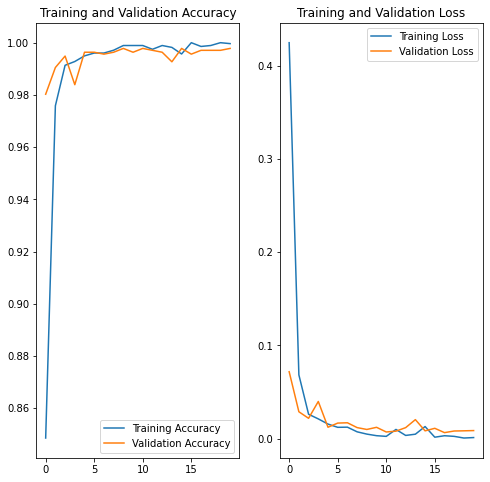

In [150]:
plot_train_val(history)

In [151]:
# Extraimos a camada intermédia
layer_name='flatten_layer'
intermediate_layer_model = Model(inputs=model_bee.input,
                                 outputs=model_bee.get_layer(layer_name).output)

In [152]:
intermediate_output = intermediate_layer_model.predict(X_train_bee) 
intermediate_output = pd.DataFrame(data=intermediate_output)

130/130 [==============================] - 2s 16ms/step


In [153]:
intermediate_output

,0,1,2,3,4,5,6,7,8,9,...,4598,4599,4600,4601,4602,4603,4604,4605,4606,4607
0,0.000000,0.459035,0.000000,0.000000,0.232338,0.0,0.646707,0.612546,0.311759,0.294671,...,0.746006,0.351989,0.0,3.899963,0.82368,2.014390,1.088696,3.201309,0.516527,0.205797
1,0.003665,0.732263,0.000000,0.346776,0.199584,0.0,0.667318,1.832381,1.708565,1.151492,...,1.638616,0.000000,0.0,1.784697,0.00000,0.158287,1.258863,2.490543,0.613193,0.000000
2,0.000000,0.776246,0.219383,0.000000,1.024421,0.0,1.162572,1.279457,0.651092,0.000000,...,0.769944,0.450989,0.0,1.368895,0.00000,0.378335,1.068458,1.882249,0.313642,0.000000
3,0.000000,0.498840,0.255782,0.000000,0.593710,0.0,0.886479,1.466794,0.665747,0.223383,...,1.211991,0.095887,0.0,1.786140,0.00000,0.402526,0.730607,2.460016,0.493632,0.000000
4,0.000000,0.907578,0.458775,0.207245,0.506057,0.0,1.317969,2.344760,0.964239,0.065746,...,0.692936,0.316003,0.0,1.719648,0.00000,0.456802,0.756413,2.475384,0.643381,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4135,0.000000,0.501128,0.245136,0.045038,0.453499,0.0,0.702174,1.519665,0.710625,0.145128,...,0.963767,0.219616,0.0,1.174631,0.00000,0.428877,0.868186,1.836344,0.402648,0.000000
4136,0.164149,0.318546,0.000000,0.065530,0.076072,0.0,0.667217,0.152939,0.241022,0.270867,...,0.000000,0.907897,0.0,1.547903,0.00000,0.864252,0.928152,0.833647,0.246628,0.000000
4137,0.000000,0.649199,0.000000,0.000000,0.416231,0.0,0.804766,0.882969,0.371686,0.150284,...,0.115607,0.244669,0.0,2.784072,0.00000,0.822017,0.939992,2.213751,0.527032,0.000000
4138,0.000000,0.390093,0.173052,0.039041,0.020036,0.0,0.632606,1.806764,1.341058,0.839833,...,0.000000,2.078087,0.0,4.285749,0.00000,3.536344,1.315161,1.982426,0.151183,0.000000


In [154]:
params_xgb = {'eta':[0.2,0.3],'gamma':[0,10],'max_depth':np.arange(3,4)}
xgb,results = train_xgb(intermediate_output,y_train_bee,4,params_xgb,'binary:logistic')

In [155]:
pd.DataFrame(results)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_eta,param_gamma,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,7.336707,0.280016,0.074783,0.010195,0.2,0,3,"{'eta': 0.2, 'gamma': 0, 'max_depth': 3}",0.999034,0.994203,0.997101,0.998068,0.997101,0.001808,2
1,11.814220,0.212687,0.070138,0.004014,0.2,10,3,"{'eta': 0.2, 'gamma': 10, 'max_depth': 3}",0.999034,0.994203,0.997101,0.998068,0.997101,0.001808,2
2,6.954331,0.088815,0.073055,0.003651,0.3,0,3,"{'eta': 0.3, 'gamma': 0, 'max_depth': 3}",0.999034,0.995169,0.997101,0.998068,0.997343,0.001429,1
3,11.664623,0.412319,0.076240,0.008042,0.3,10,3,"{'eta': 0.3, 'gamma': 10, 'max_depth': 3}",0.999034,0.994203,0.997101,0.997101,0.996860,0.001725,4


#### Validating Model Bee VS Wasp

#### CNN

64/64 [==============================] - 1s 22ms/step - loss: 0.0091 - accuracy: 0.9971
Independent Test Accuracy:  0.9970588088035583
Independent Test Precision:  0.9956896551724138
Independent Test Recall:  0.9978401727861771


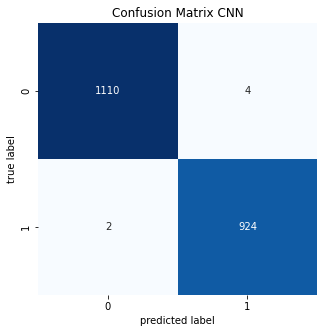

In [169]:
y_preds_bee = model_bee.predict(X_IVS_bee)
y_preds_bee = (y_preds_bee > 0.5).astype(int)
print("Independent Test Accuracy: ",model_bee.evaluate(X_IVS_bee,y_IVS_bee)[1])
print("Independent Test Precision: ",precision_score(y_IVS_bee,y_preds_bee))
print("Independent Test Recall: ",recall_score(y_IVS_bee,y_preds_bee))
plot_confusion_matrix(y_IVS_bee,y_preds_bee,'CNN')

#### CNN+XGBOOST

In [158]:
intermediate_test_output = intermediate_layer_model.predict(X_IVS_bee)
intermediate_test_output = pd.DataFrame(data=intermediate_test_output)

64/64 [==============================] - 1s 15ms/step


Independent Test Accuracy:  0.9975490196078431
Independent Test Precision:  0.9978378378378379
Independent Test Recall:  0.9967602591792657


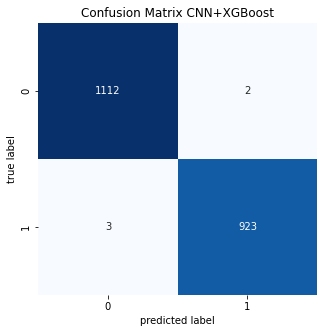

In [170]:
y_preds_bee = xgb.predict(intermediate_test_output)
print("Independent Test Accuracy: ",xgb.score(intermediate_test_output,y_IVS_bee))
print("Independent Test Precision: ",precision_score(y_IVS_bee,y_preds_bee))
print("Independent Test Recall: ",recall_score(y_IVS_bee,y_preds_bee))
plot_confusion_matrix(y_IVS_bee,y_preds_bee,'CNN+XGBoost')

## Varroa Model

In [84]:
n_splits = 4
loss = tf.keras.losses.BinaryCrossentropy()
params_varroa = {'filters__Conv2D':[[16,32,64,128],[8,16,32,64]],
          'kernel_size__Conv2D': [2,4],
          'momentum__BatchNormalization':[0.2],
          'epsilon__BatchNormalization':[1e-4],
          'pool_size__MaxPooling2D':[2],
          'rate__Dropout':[0.2,0.4],
          'units__Dense': [1],
          'activation__Dense': ['sigmoid'],
          'name__Flatten':['flatten_layer']}
histories_varroa = cv(X_train_varroa,y_train_varroa,params_varroa,n_splits,90,10,loss,dims)

Model: "cnn_0"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 150, 75, 16)       208       
                                                                 
 batch_normalization (BatchN  (None, 150, 75, 16)      64        
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 150, 75, 32)       2080      
                                                                 
 batch_normalization_1 (Batc  (None, 150, 75, 32)      128       
 hNormalization)                                                 
                                                                 
 max_pooling2d (MaxPooling2D  (None, 75, 37, 32)       0         
 )                                                               
                                                             

In [85]:
scores_df_varroa = pd.DataFrame(get_scores(histories_varroa,n_splits))
scores_df_varroa

,model_name,val_accuracy_mean,val_loss_mean
0,cnn_0,0.885663,0.291231
1,cnn_1,0.866615,0.342784
2,cnn_2,0.922008,0.229316
3,cnn_3,0.909658,0.250954
4,cnn_4,0.758983,0.499374
5,cnn_5,0.849327,0.392072
6,cnn_6,0.889194,0.292975
7,cnn_7,0.877902,0.324792


In [86]:
models_def = grid_search(params_varroa)
idx_model = select_best_model(scores_df_varroa)
model_varroa = create_model(models_def[idx_model],dims)
model_varroa.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                loss=tf.keras.losses.BinaryCrossentropy(),
                metrics=['accuracy'])

In [87]:
X_train, X_test, y_train, y_test = train_test_split(X_train_varroa,y_train_varroa,test_size=0.33, random_state=0)

In [88]:
epochs = 15
#epochs = 50
history_varroa = model_varroa.fit(
  x=X_train,
  y=y_train,
  validation_data=(X_test,y_test),
  epochs=epochs,
  batch_size = 90
)

Epoch 1/15
22/22 [==============================] - 6s 264ms/step - loss: 0.6636 - accuracy: 0.6096 - val_loss: 0.5614 - val_accuracy: 0.7254
Epoch 2/15
22/22 [==============================] - 5s 229ms/step - loss: 0.4905 - accuracy: 0.7866 - val_loss: 0.3831 - val_accuracy: 0.8643
Epoch 3/15
22/22 [==============================] - 5s 228ms/step - loss: 0.3592 - accuracy: 0.8504 - val_loss: 0.2897 - val_accuracy: 0.8921
Epoch 4/15
22/22 [==============================] - 5s 234ms/step - loss: 0.2977 - accuracy: 0.8815 - val_loss: 0.2653 - val_accuracy: 0.8953
Epoch 5/15
22/22 [==============================] - 5s 235ms/step - loss: 0.2640 - accuracy: 0.9036 - val_loss: 0.2631 - val_accuracy: 0.8996
Epoch 6/15
22/22 [==============================] - 5s 233ms/step - loss: 0.2376 - accuracy: 0.9162 - val_loss: 0.2141 - val_accuracy: 0.9188
Epoch 7/15
22/22 [==============================] - 5s 233ms/step - loss: 0.2255 - accuracy: 0.9189 - val_loss: 0.2126 - val_accuracy: 0.9252
Epoch 

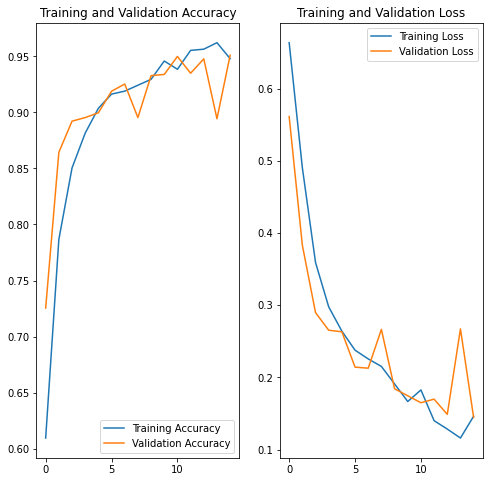

In [89]:
plot_train_val(history_varroa)

In [90]:
# Extraimos a camada intermédia
layer_name='flatten_layer'
intermediate_layer_model = Model(inputs=model_varroa.input,
                                 outputs=model_varroa.get_layer(layer_name).output)

intermediate_output = intermediate_layer_model.predict(X_train_varroa) 
intermediate_output = pd.DataFrame(data=intermediate_output)
intermediate_output

89/89 [==============================] - 2s 22ms/step


,0,1,2,3,4,5,6,7,8,9,...,4598,4599,4600,4601,4602,4603,4604,4605,4606,4607
0,0.532571,0.745534,0.0,0.040359,0.000000,0.0,0.415771,0.000000,0.215374,0.957469,...,0.0,0.345447,0.000000,0.318265,0.452559,0.0,0.703945,0.0,0.000000,0.0
1,0.000000,1.534627,0.0,0.207164,0.000000,0.0,0.000000,0.093447,0.139434,0.457225,...,0.0,0.279910,0.068155,0.481363,0.090871,0.0,0.333404,0.0,0.162132,0.0
2,0.000000,0.397470,0.0,0.599562,0.000000,0.0,0.157697,0.000000,0.000000,0.950642,...,0.0,0.218981,0.000000,0.516232,0.247928,0.0,0.381311,0.0,0.156358,0.0
3,0.000000,0.334729,0.0,0.130852,0.000000,0.0,0.034765,0.000000,0.000000,0.719643,...,0.0,0.476125,0.188891,0.956244,0.537468,0.0,0.914229,0.0,0.000000,0.0
4,0.000000,0.328957,0.0,0.291165,0.000000,0.0,0.169325,0.046476,0.000000,0.738464,...,0.0,0.202906,0.000000,0.276769,0.097354,0.0,0.311319,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2829,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1.094665,...,0.0,0.243459,0.128716,0.479205,0.263587,0.0,0.341373,0.0,0.121653,0.0
2830,0.000000,0.000000,0.0,0.000000,0.162598,0.0,0.320190,0.000000,0.000000,1.401578,...,0.0,0.772159,0.220140,0.415024,0.601305,0.0,0.920783,0.0,0.000000,0.0
2831,0.000000,0.806350,0.0,0.216746,0.000000,0.0,0.007337,0.000000,0.000000,1.028622,...,0.0,0.191401,0.000000,0.505243,0.127218,0.0,0.382494,0.0,0.118715,0.0
2832,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.016897,0.014388,0.000000,0.903151,...,0.0,0.192903,0.038617,0.395650,0.070205,0.0,0.309164,0.0,0.050049,0.0


In [91]:
params_xgb = {'eta':[0.2,0.3],'gamma':[0,10],'max_depth':np.arange(3,4)}
xgb_varroa,results = train_xgb(intermediate_output,y_train_varroa,4,params_xgb,'binary:logistic')
pd.DataFrame(results)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_eta,param_gamma,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,11.147810,0.065945,0.066189,0.003623,0.2,0,3,"{'eta': 0.2, 'gamma': 0, 'max_depth': 3}",0.957687,0.967560,0.961864,0.959040,0.961538,0.003790,1
1,11.964098,0.269607,0.066819,0.004368,0.2,10,3,"{'eta': 0.2, 'gamma': 10, 'max_depth': 3}",0.946403,0.961918,0.959040,0.953390,0.955188,0.005927,4
2,10.702325,0.175005,0.065951,0.002074,0.3,0,3,"{'eta': 0.3, 'gamma': 0, 'max_depth': 3}",0.956276,0.964739,0.956215,0.964689,0.960480,0.004234,2
3,12.324465,0.454390,0.068485,0.004777,0.3,10,3,"{'eta': 0.3, 'gamma': 10, 'max_depth': 3}",0.954866,0.963329,0.959040,0.949153,0.956597,0.005237,3


#### Validating Model Varroa

#### CNN

44/44 [==============================] - 1s 29ms/step - loss: 0.1697 - accuracy: 0.9427
Independent Test Accuracy:  0.94273442029953
Independent Test Precision:  0.9380403458213257
Independent Test Recall:  0.9462209302325582


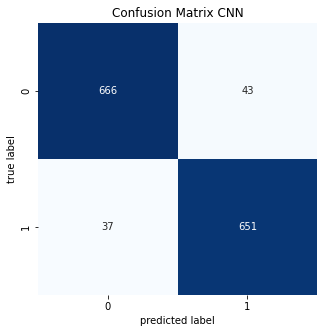

In [92]:
y_preds_varroa = model_varroa.predict(X_IVS_varroa)
y_preds_varroa = (y_preds_varroa > 0.5).astype(int)
print("Independent Test Accuracy: ",model_varroa.evaluate(X_IVS_varroa,y_IVS_varroa)[1])
print("Independent Test Precision: ",precision_score(y_IVS_varroa,y_preds_varroa))
print("Independent Test Recall: ",recall_score(y_IVS_varroa,y_preds_varroa))
plot_confusion_matrix(y_IVS_varroa,y_preds_varroa,'CNN')

#### CNN+XGBOOST

44/44 [==============================] - 1s 19ms/step
Independent Test Accuracy:  0.9491768074445239
Independent Test Precision:  0.9351198871650211
Independent Test Recall:  0.9636627906976745


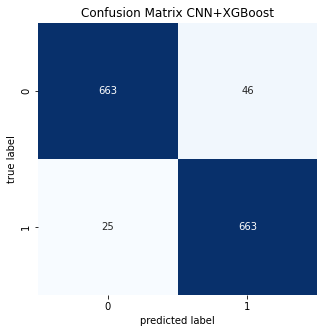

In [93]:
intermediate_test_output = intermediate_layer_model.predict(X_IVS_varroa)
intermediate_test_output = pd.DataFrame(data=intermediate_test_output)
y_preds_varroa = xgb_varroa.predict(intermediate_test_output)
print("Independent Test Accuracy: ",xgb_varroa.score(intermediate_test_output,y_IVS_varroa))
print("Independent Test Precision: ",precision_score(y_IVS_varroa,y_preds_varroa))
print("Independent Test Recall: ",recall_score(y_IVS_varroa,y_preds_varroa))
plot_confusion_matrix(y_IVS_varroa,y_preds_varroa,'CNN+XGBoost')

## Multi-job Model

In [64]:
n_splits = 4
dims= (150,75,3)
loss = tf.keras.losses.BinaryCrossentropy()
params_multi = {'filters__Conv2D':[[8,16,32,64]], # [16,32,64,128],
          'kernel_size__Conv2D': [2,4],
          'momentum__BatchNormalization':[0.2],
          'epsilon__BatchNormalization':[1e-3], # [1e-4]
          'pool_size__MaxPooling2D':[2],
          'rate__Dropout':[0.2,0.4],
          'units__Dense': [2],
          'activation__Dense': ['sigmoid'],
          'name__Flatten':['flatten_layer']}

histories_multi = cv(X_train_multi,y_train_multi,params_multi,n_splits,32,10,loss,dims)

Model: "cnn_0"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 150, 75, 8)        104       
                                                                 
 batch_normalization (BatchN  (None, 150, 75, 8)       32        
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 150, 75, 16)       528       
                                                                 
 batch_normalization_1 (Batc  (None, 150, 75, 16)      64        
 hNormalization)                                                 
                                                                 
 max_pooling2d (MaxPooling2D  (None, 75, 37, 16)       0         
 )                                                               
                                                             

2022-05-27 03:01:20.070334: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8204


98/98 [==============================] - 7s 52ms/step - loss: 0.6241 - accuracy: 0.6772 - val_loss: 0.3996 - val_accuracy: 0.7358
Epoch 2/10
98/98 [==============================] - 4s 46ms/step - loss: 0.3551 - accuracy: 0.7647 - val_loss: 0.3314 - val_accuracy: 0.7589
Epoch 3/10
98/98 [==============================] - 4s 45ms/step - loss: 0.3038 - accuracy: 0.7708 - val_loss: 0.2986 - val_accuracy: 0.7627
Epoch 4/10
98/98 [==============================] - 4s 45ms/step - loss: 0.2805 - accuracy: 0.7692 - val_loss: 0.2807 - val_accuracy: 0.7541
Epoch 5/10
98/98 [==============================] - 4s 45ms/step - loss: 0.2591 - accuracy: 0.7689 - val_loss: 0.2579 - val_accuracy: 0.7598
Epoch 6/10
98/98 [==============================] - 4s 45ms/step - loss: 0.2436 - accuracy: 0.7747 - val_loss: 0.2453 - val_accuracy: 0.7598
Epoch 7/10
98/98 [==============================] - 4s 44ms/step - loss: 0.2265 - accuracy: 0.7779 - val_loss: 0.2219 - val_accuracy: 0.7646
Epoch 8/10
98/98 [======

In [65]:
scores_df_multi = pd.DataFrame(get_scores(histories_multi,n_splits))
scores_df_multi

,model_name,val_accuracy_mean,val_loss_mean
0,cnn_0,0.773372,0.215940
1,cnn_1,0.793556,0.214962
2,cnn_2,0.796695,0.110468
3,cnn_3,0.812546,0.079826


In [66]:
models_def = grid_search(params_multi)
idx_model = select_best_model(scores_df_multi)
model_multi = create_model(models_def[idx_model],dims)
model_multi.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                loss=tf.keras.losses.BinaryCrossentropy(),
                metrics=['accuracy'])
model_multi.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_11 (Conv2D)          (None, 150, 75, 8)        392       
                                                                 
 batch_normalization_2 (Batc  (None, 150, 75, 8)       32        
 hNormalization)                                                 
                                                                 
 conv2d_12 (Conv2D)          (None, 150, 75, 16)       2064      
                                                                 
 batch_normalization_3 (Batc  (None, 150, 75, 16)      64        
 hNormalization)                                                 
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 75, 37, 16)       0         
 2D)                                                             
                                                      

In [67]:
X_train, X_test, y_train, y_test = train_test_split(X_train_multi,y_train_multi,test_size=0.33, random_state=0)

In [68]:
epochs = 20
#epochs = 50
history_multi = model_multi.fit(
  x=X_train,
  y=y_train,
  validation_data=(X_test,y_test),
  epochs=epochs,
  batch_size = 32
)

Epoch 1/20
88/88 [==============================] - 5s 61ms/step - loss: 0.5672 - accuracy: 0.6918 - val_loss: 0.5003 - val_accuracy: 0.8049
Epoch 2/20
88/88 [==============================] - 5s 54ms/step - loss: 0.3333 - accuracy: 0.7854 - val_loss: 0.2709 - val_accuracy: 0.8057
Epoch 3/20
88/88 [==============================] - 5s 54ms/step - loss: 0.2344 - accuracy: 0.8091 - val_loss: 0.1956 - val_accuracy: 0.8428
Epoch 4/20
88/88 [==============================] - 5s 56ms/step - loss: 0.1752 - accuracy: 0.8184 - val_loss: 0.1589 - val_accuracy: 0.8457
Epoch 5/20
88/88 [==============================] - 5s 55ms/step - loss: 0.1322 - accuracy: 0.8199 - val_loss: 0.1413 - val_accuracy: 0.7285
Epoch 6/20
88/88 [==============================] - 5s 55ms/step - loss: 0.1034 - accuracy: 0.8052 - val_loss: 0.1183 - val_accuracy: 0.8690
Epoch 7/20
88/88 [==============================] - 5s 54ms/step - loss: 0.0922 - accuracy: 0.8199 - val_loss: 0.1295 - val_accuracy: 0.8821
Epoch 8/20
88

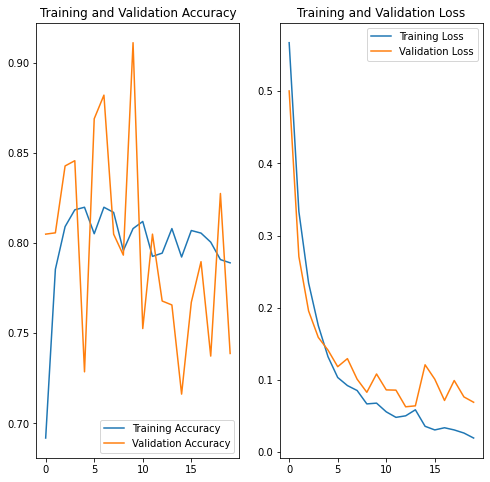

In [69]:
plot_train_val(history_multi)

In [70]:
# Extraimos a camada intermédia
layer_name='flatten_layer'
intermediate_layer_model = Model(inputs=model_multi.input,
                                 outputs=model_multi.get_layer(layer_name).output)

intermediate_output = intermediate_layer_model.predict(X_train_multi) 
intermediate_output = pd.DataFrame(data=intermediate_output)
intermediate_output

131/131 [==============================] - 2s 12ms/step


,0,1,2,3,4,5,6,7,8,9,...,2294,2295,2296,2297,2298,2299,2300,2301,2302,2303
0,0.000000,0.922237,0.000000,1.806406,0.012061,0.000000,0.000000,0.597010,0.000000,0.000000,...,0.000000,0.0000,0.435138,0.600585,0.0,0.868358,0.000000,0.074765,0.252582,0.0
1,0.000000,0.433600,0.000000,0.000000,0.879874,0.425701,0.000000,1.356255,0.000000,0.000000,...,0.444871,0.0000,0.000000,0.750902,0.0,0.203119,0.201637,0.000000,0.174725,0.0
2,1.072349,0.000000,0.300363,2.125224,0.008235,0.000000,0.194744,0.000000,0.533815,0.276405,...,0.050418,0.0000,0.000000,0.657651,0.0,0.738991,0.572536,0.000000,0.305102,0.0
3,1.962325,1.528134,0.000000,1.080319,0.100331,0.000000,0.506332,1.521339,0.000000,0.000000,...,0.666249,0.0000,0.000000,0.392138,0.0,0.231487,0.000000,0.000000,0.000000,0.0
4,1.561332,0.377325,0.000000,1.203127,0.532453,0.000000,0.609397,1.005846,0.000000,0.000000,...,0.533359,0.0308,0.000000,0.660900,0.0,0.064189,0.222049,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4156,0.428038,0.283226,0.000000,1.561189,0.203524,0.000000,0.458936,0.230752,0.273658,0.000000,...,0.000000,0.0000,0.000000,0.760052,0.0,0.072890,0.402776,0.222355,0.065907,0.0
4157,0.103346,0.332854,0.000000,0.172595,0.586317,0.000000,0.000000,0.161639,0.169302,0.460733,...,0.587417,0.0000,0.000000,0.982314,0.0,0.301284,0.473140,0.000000,0.117147,0.0
4158,0.000000,0.000000,0.000000,0.000000,0.000000,2.477329,0.000000,0.000000,0.000000,0.962866,...,0.674933,0.0000,0.000000,0.623722,0.0,0.095761,0.271838,0.000000,0.082100,0.0
4159,0.000000,0.223521,0.000000,0.000000,0.167695,0.957768,0.000000,0.070004,0.000000,1.530165,...,0.572819,0.0000,0.000000,0.634851,0.0,0.269434,0.027301,0.000000,0.000000,0.0


In [72]:
params_xgb = {'eta':[0.2,0.3],'gamma':[0,10],'max_depth':np.arange(3,4)}
xgb_multi,results = train_xgb(intermediate_output,y_train_bee_job_XGB,4,params_xgb,'multi:softmax')
pd.DataFrame(results)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_eta,param_gamma,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,34.444222,0.874931,0.045856,0.003701,0.2,0,3,"{'eta': 0.2, 'gamma': 0, 'max_depth': 3}",0.978866,0.977885,0.987500,0.982692,0.981736,0.003782,1
1,39.528693,1.223025,0.044618,0.002476,0.2,10,3,"{'eta': 0.2, 'gamma': 10, 'max_depth': 3}",0.967339,0.970192,0.985577,0.972115,0.973806,0.007005,3
2,30.365095,0.826617,0.044831,0.003009,0.3,0,3,"{'eta': 0.3, 'gamma': 0, 'max_depth': 3}",0.974063,0.979808,0.987500,0.980769,0.980535,0.004769,2
3,38.855931,1.746749,0.046301,0.005492,0.3,10,3,"{'eta': 0.3, 'gamma': 10, 'max_depth': 3}",0.964457,0.970192,0.984615,0.974038,0.973326,0.007356,4


#### Validating Model Bee job

#### CNN

65/65 [==============================] - 1s 19ms/step - loss: 0.0748 - accuracy: 0.7366
Independent Test Accuracy:  0.7365853786468506


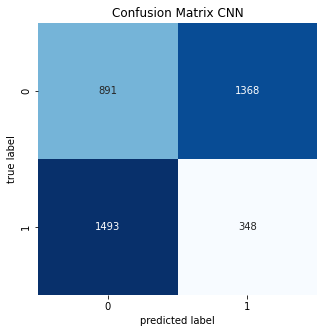

In [75]:
y_preds_multi = model_multi.predict(X_IVS_multi)
y_preds_multi = (y_preds_multi > 0.5).astype(int)
print("Independent Test Accuracy: ",model_multi.evaluate(X_IVS_multi,y_IVS_multi)[1])
plot_confusion_matrix(y_IVS_multi,y_preds_multi,'CNN')

#### CNN+XGBOOST

65/65 [==============================] - 1s 12ms/step
Independent Test Accuracy:  0.9770731707317073


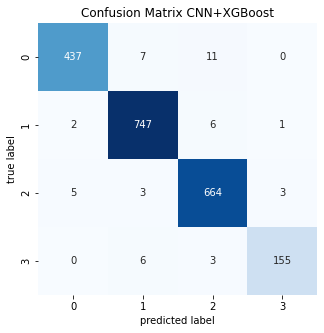

In [79]:
intermediate_test_output = intermediate_layer_model.predict(X_IVS_multi)
intermediate_test_output = pd.DataFrame(data=intermediate_test_output)
y_preds_multi = xgb_multi.predict(intermediate_test_output)
print("Independent Test Accuracy: ",xgb_multi.score(intermediate_test_output,y_IVS_bee_job_XGB))
plot_confusion_matrix(y_IVS_bee_job_XGB,y_preds_multi,'CNN+XGBoost')

### Outro dataset de abelhas